In [35]:
## SETUP

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

import os
import sys
import copy
import pickle
import time

from utils.Grokking_lib import *

import math
import random
random.seed(0)
pair_seed = 420

dtype = torch.float32

############## Use GPU ##############
USE_GPU = False
#####################################
if USE_GPU == True and torch.cuda.is_available():
    device = torch.device('CUDA')
else:
    device = torch.device('cpu')
print('using device:', device)

using device: cpu


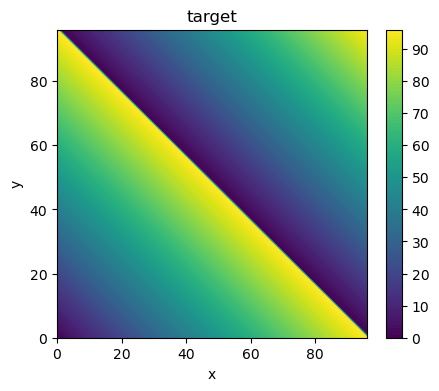

In [107]:
## Modular Arithmeitic Dataset

######################### Generate noisy dataset #########################
def create_dataset(p:int, pair_seed:int, frac:float, device, dtype):
    
    pairs = [(i,j) for i in range(p) for j in range(p)]
    X_og = torch.tensor(pairs)
    Y_og = (( X_og[:,0]**1 + X_og[:,1]**1 )**1) % p
    X_og = F.one_hot(X_og, num_classes=p)
    
    #### Deterministic shuffle
    random.seed(pair_seed)
    orderlist = list(range(len(pairs)))
    random.shuffle(orderlist)
    pairs = [pairs[i] for i in orderlist]
    
    X = torch.tensor(pairs)
    Y = (( X[:,0]**1 + X[:,1]**1 )**1) % p
    # Y = (( X[:,0]**2 +  X[:,1]**2 )**2) % p
    X = F.one_hot(X, num_classes=p)
    total_size = Y.shape[0]
    train_size = int(frac * total_size)
    test_size = total_size - train_size

    # n_noise = int(noise_level * train_size)
    # ids = torch.arange(n_noise)

    # if fixed_seed == True:
    #     torch.random.manual_seed(0)
    #     random_labels = torch.randint(0, p-1, (n_noise,))
    #     labels_noise = Y
    #     labels_noise[:n_noise] = random_labels
    # else:
    #     random_labels = torch.randint(0, p-1, (n_noise,))
    #     labels_noise = Y
    #     print(labels_noise.shape, random_labels.shape)
    #     labels_noise[torch.randperm(train_size)[:n_noise]] = random_labels
    #     # labels_noise[:n_noise] = random_labels
    
    # Y_noisy = torch.zeros_like(labels_noise)
    # for i in range(total_size):
    #     Y_noisy[orderlist[i]] = labels_noise[i]
    # Y_noisy = Y_noisy.to(device=device, dtype=torch.long)
       
    X_og = X_og.to(device=device, dtype=dtype)
    Y_og = Y_og.to(device=device, dtype=torch.long)
    X_train = X[:train_size].to(device=device, dtype=dtype)
    Y_train = Y[:train_size].to(device=device, dtype=torch.long)
    X_test = X[train_size:].to(device=device, dtype=dtype)
    Y_test = Y[train_size:].to(device=device, dtype=torch.long)
    
    return X_train, Y_train, X_test, Y_test, X_og, Y_og


def visualize_dataset(p, data_frac):
    X_train, Y_train, X_test, Y_test, X_og, Y_og = create_dataset(p, pair_seed, data_frac, device, dtype)
    total_size = Y_og.shape[0]
    
    #####
    targets_og_2d = np.zeros((p,p))
    targets_noisy_2d = np.zeros((p,p))
    outputs_2d = np.zeros((p,p))
    for i in range(total_size):
        targets_og_2d[i//p,i%p] = Y_og[i]
        targets_noisy_2d[i//p,i%p] = Y_noisy[i]

    #####
    plt.figure(figsize=(5,4))

    plt.title(f'target')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.contourf(np.arange(p), np.arange(p), targets_og_2d, levels=np.arange(p))
    plt.colorbar()

    plt.show()
    
p = 97
data_frac = 0.9

visualize_dataset(p, data_frac)

# Analytical solutions

In [111]:
N = 500    # width
p = 97     # modular base

## Analytical solutions

torch.manual_seed(1)
Student = fcn(2*p, N, p)

js = torch.arange(p)
ks = torch.arange(N)
kjs = torch.outer(ks, js)
jks = torch.outer(js,ks)

fu = torch.outer(2*np.pi * torch.rand(N), torch.ones(p))
fv = torch.outer(2*np.pi * torch.rand(N), torch.ones(p))
fw = (fu+fv).t()

Student.fc1.weight.data[:,:p] = np.power(2/N, 1/3) * torch.cos(2*np.pi * kjs/p + fu) 
Student.fc1.weight.data[:,p:] = np.power(2/N, 1/3) * torch.cos(2*np.pi * kjs/p + fv)
Student.fc2.weight.data[:,:] = np.power(2/N, 1/3) * torch.cos(-2*np.pi * jks/p - fw)


## add noisy frequencies

# jjs = torch.outer(js, js)
# jjs1 = torch.tile(jjs, (N,1,1))
# jjs2 = torch.tile(jjs, (N,1,1)).transpose(0,1)

# pu = 2*np.pi * torch.tile(torch.rand((N, p)), (p,1,1)).transpose(0,1)
# normu = torch.tile(Student.fc1.weight.data.clone()[:,:p].norm(dim=1), (p,1)).transpose(0,1)

# pv = 2*np.pi * torch.tile(torch.rand((N, p)), (p,1,1)).transpose(0,1)
# normv = torch.tile(Student.fc1.weight.data.clone()[:,p:].norm(dim=1), (p,1)).transpose(0,1)

# pw = 2*np.pi * torch.tile(torch.rand((p, N)), (p,1,1)).transpose(1,2)
# normw = torch.tile(Student.fc2.weight.data.clone()[:,:].norm(dim=0), (p,1))

# delta = 0
# deltau = (torch.rand((N,p)) - 0.5) * 2 * delta
# deltav = (torch.rand((N,p)) - 0.5) * 2 * delta
# deltaw = (torch.rand((p,N)) - 0.5) * 2 * delta

# Student.fc1.weight.data[:,:p] += np.power(2/N, 1/3) * deltau * torch.cos(2*np.pi * jjs1/p + pu).sum(axis=-1)
# Student.fc1.weight.data[:,p:] += np.power(2/N, 1/3) * deltav * torch.cos(2*np.pi * jjs1/p + pv).sum(axis=-1)
# Student.fc2.weight.data[:,:] += np.power(2/N, 1/3) * deltaw * torch.cos(2*np.pi * jjs2/p + pw).sum(axis=-1)

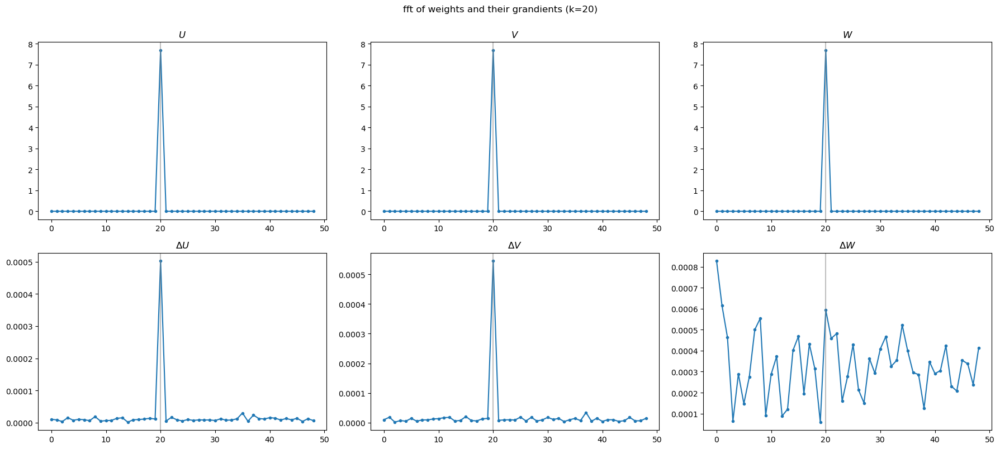

In [113]:
## fft of weights and their gradients (U,V rows / W columns)

noise_level = 0.0
data_frac = 0.5
X_train, Y_train, X_test, Y_test, X_og, Y_og = create_dataset(p, pair_seed, data_frac, device, dtype)
total_size = Y_og.shape[0]

grads = calculate_gradients(copy.deepcopy(Student), X_train, Y_train, dtype, device, 'MSE')

k = 20
d = 1
line_k = np.rint(k/d)

plt.figure(figsize=(18,8))
plt.suptitle(f'fft of weights and their grandients (k={k})', y=1.0)

plt.subplot(2,3,1)
plt.title('$U$')
plt.plot(np.abs(np.fft.rfft(Student.fc1.weight[k,:p].detach().cpu().numpy())), '.-')
line(line_k, p)

plt.subplot(2,3,2)
plt.title('$V$')
plt.plot(np.abs(np.fft.rfft(Student.fc1.weight[k,p:].detach().cpu().numpy())), '.-')
line(line_k, p)

plt.subplot(2,3,3)
plt.title('$W$')
plt.plot(np.abs(np.fft.rfft(Student.fc2.weight[:,k].detach().cpu().numpy())), '.-')
line(line_k, p)


plt.subplot(2,3,4)
plt.title('$\\Delta U$')
plt.plot(np.abs(np.fft.rfft(grads['fc1.weight'][k,:p].detach().cpu().numpy())), '.-')
line(line_k % p, p)
# line(3*line_k % p, p, 'green')

plt.subplot(2,3,5)
plt.title('$\\Delta V$')
plt.plot(np.abs(np.fft.rfft(grads['fc1.weight'][k,p:].detach().cpu().numpy())), '.-')
line(line_k % p, p)
# line(3*line_k % p, p, 'green')

plt.subplot(2,3,6)
plt.title('$\\Delta W$')
plt.plot(np.abs(np.fft.rfft(grads['fc2.weight'][:,k].detach().cpu().numpy())), '.-')
line(line_k % p, p)
# lines(3*line_k % p, 'green')

plt.tight_layout()
# plt.savefig(f'grokking_analytical.pdf', dpi=300, format='pdf')
plt.show()

In [114]:
## Calculate losses and accuracies for analytical network

Student.to(device=device)
Student.eval()

train_loss = F.mse_loss(Student(X_train), F.one_hot(Y_train, p).to(device=device)).item()
test_loss = F.mse_loss(Student(X_test), F.one_hot(Y_test, p).to(device=device)).item()
print(f'train_loss: {train_loss} \t test_loss: {test_loss}')

_,_,train_acc = check_accuracy_grokking(X_train, Y_train, Student, dtype, device, None)
_,_,test_acc = check_accuracy_grokking(X_test, Y_test, Student, dtype, device, None)

print(f'train_acc: {train_acc} \t test_acc: {test_acc}')

train_loss: 0.008726729080080986 	 test_loss: 0.008745227940380573
train_acc: 1.0 	 test_acc: 1.0


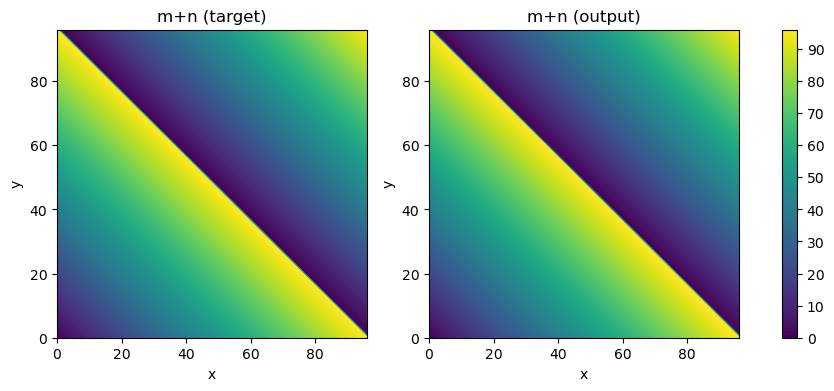

In [115]:
## Plot target and output

outputs = Student(X_og).real
targets_2d = np.zeros((p,p))
outputs_2d = np.zeros((p,p))
for i in range(total_size):
    targets_2d[i//p,i%p] = Y_og[i]
    outputs_2d[i//p,i%p] = outputs[i].argmax()

    
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(11,4))

ax1.set_title('m+n (target)')
ax1.set_xlabel('x')
ax1.set_ylabel('y')
cs_target = ax1.contourf(np.arange(p), np.arange(p), targets_2d, levels=np.arange(p))

ax2.set_title('m+n (output)')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
cs_output = ax2.contourf(np.arange(p), np.arange(p), outputs_2d, levels=np.arange(p))

plt.colorbar(cs_output, ax=[ax1,ax2])

plt.show()

# Training

In [116]:
epochs = 1000
data_every = 10
time = 10000000000
dp = 0

lr = 1e-3          # decent choices (N=500) : 5e1 for GD, 1e-2 for AdamW
wd = 0.0           # decent choices (N=500) : 0. for GD, [0.,8.] for AdamW
dp = 0.0

In [118]:
## Training

########################### Generatre dataset ###########################
p = 97
data_frac = 0.5
X_train, Y_train, X_test, Y_test, X_og, Y_og = create_dataset(p, pair_seed, data_frac, device, dtype)
total_size = Y_og.shape[0]


########################### Initialize the model ###########################
N = 500
torch.manual_seed(1)
Student = fcn(2*p, N, p, dp)

# Student.fc1.weight.data = 2 * Student.fc1.weight.data
# Student.fc2.weight.data = 2 * Student.fc2.weight.data


########################### Data arrays ###########################
if_weight_norms = True
if_grad_norms = True
if_iprs = True
if_weights = True
if_grads = True
if_features = True

r = 2
chi_ipr = 0.5

data_epochs = np.arange(data_every, epochs+1, data_every)
if 1 not in data_epochs: data_epochs = np.insert(data_epochs, 0, 1)
if epochs not in data_epochs: data_epochs = np.append(data_epochs, epochs)

train_losses = np.empty(data_epochs.shape[0], float)
test_losses = np.empty(data_epochs.shape[0], float)
train_accs = np.empty(data_epochs.shape[0], float)
test_accs = np.empty(data_epochs.shape[0], float)

if if_weight_norms:
    weight_norms = {
        'U' : np.empty(data_epochs.shape[0], float),
        'V' : np.empty(data_epochs.shape[0], float),
        'W' : np.empty(data_epochs.shape[0], float)
    }
    
if if_grad_norms:
    grad_norms = {
        'U' : np.empty(data_epochs.shape[0], float),
        'V' : np.empty(data_epochs.shape[0], float), 
        'W' : np.empty(data_epochs.shape[0], float)
    }
    
if if_weights:
    weights = {
        'U':np.empty((data_epochs.shape[0], N, p), float), 
        'V':np.empty((data_epochs.shape[0], N, p), float), 
        'W':np.empty((data_epochs.shape[0], p, N), float)
    }
    weight_init = {
    'U': copy.deepcopy(Student.fc1.weight.detach().cpu().numpy())[:,:p],
    'V': copy.deepcopy(Student.fc1.weight.detach().cpu().numpy())[:,p:],
    'W': copy.deepcopy(Student.fc2.weight.detach().cpu().numpy()),
}
    
if if_grads:
    grads = {
        'U':np.empty((data_epochs.shape[0], N, p), float), 
        'V':np.empty((data_epochs.shape[0], N, p), float), 
        'W':np.empty((data_epochs.shape[0], p, N), float)
    }
if if_iprs:  
    iprs = {
        'U' : np.empty((data_epochs.shape[0], N), float),
        'V' : np.empty((data_epochs.shape[0], N), float),
        'W' : np.empty((data_epochs.shape[0], N), float),
        'U_grad' : np.empty((data_epochs.shape[0], N), float),
        'V_grad' : np.empty((data_epochs.shape[0], N), float),
        'W_grad' : np.empty((data_epochs.shape[0], N), float)
    }
    counts = {
        'U' : np.empty(data_epochs.shape[0], float),
        'V' : np.empty(data_epochs.shape[0], float),
        'W' : np.empty(data_epochs.shape[0], float), 
        'U_grad' : np.empty(data_epochs.shape[0], float),
        'V_grad' : np.empty(data_epochs.shape[0], float), 
        'W_grad' : np.empty(data_epochs.shape[0], float)
    }   # counts the number of rows with IPR greater than chi_ipr = 0.25 (default)
    gini_coefs = {
        'U' : np.empty((data_epochs.shape[0], N), float),
        'V' : np.empty((data_epochs.shape[0], N), float),
        'W' : np.empty((data_epochs.shape[0], N), float),
        'U_grad' : np.empty((data_epochs.shape[0], N), float),
        'V_grad' : np.empty((data_epochs.shape[0], N), float),
        'W_grad' : np.empty((data_epochs.shape[0], N), float)
    }
    
if if_features:    
    h1s_ordered = np.empty((data_epochs.shape[0], total_size, N), float)
    h2s_ordered = np.empty((data_epochs.shape[0], total_size, p), float)


########################### Copy the model for computing features ###########################
if if_features:
    Student_copy = fcn(2*p, N, p)
    Student_copy = Student_copy.to(device=device)
    hook1 = Hook(Student_copy.fc1)
    hook2 = Hook(Student_copy.fc2)


########################### Optimizer ###########################
optimizer = optim.AdamW(Student.parameters(), lr=lr,  weight_decay=wd, betas=(0.9, 0.98), eps=1e-08)
# optimizer = optim.SGD(Student.parameters(), lr=lr, weight_decay=wd, momentum=0.0)


########################### Training loop ###########################
i_d = 0
for epoch in range(1,epochs+1):
    if epoch in data_epochs:
        if_data = True
    else:
        if_data = False
        
    train_data = train_one_epoch_grokking(
        Student, optimizer, time, X_train, Y_train, X_test, Y_test,
        dtype, device, losstype='MSE', if_data=if_data, verbose=False
    )
    
    ## collect data
    if if_data:
        train_losses[i_d] = train_data['loss'][-1]
        test_losses[i_d] = train_data['val_loss'][-1]
        train_accs[i_d] = train_data['tr_acc'][-1]
        test_accs[i_d] = train_data['val_acc'][-1]

        if if_features:
            with torch.no_grad():
                Student_copy.load_state_dict(Student.state_dict())
                outputs_ordered = Student_copy(X_og.to(dtype=dtype))
                h1s_ordered[i_d] = hook1.output.detach().cpu().numpy()
                h2s_ordered[i_d] = hook2.output.detach().cpu().numpy()
        
        if if_weights or if_weight_norms or if_iprs:
            U = copy.deepcopy(Student.fc1.weight.data[:, :p]).detach().cpu().numpy()
            V = copy.deepcopy(Student.fc1.weight.data[:, p:]).detach().cpu().numpy()
            W = copy.deepcopy(Student.fc2.weight.data).detach().cpu().numpy()

        if if_grads or if_grad_norms or if_iprs:
            U_grad = train_data['grad1'][0][:,:p]
            V_grad = train_data['grad1'][0][:,p:]
            W_grad = train_data['grad2'][0]

        if if_weights:
            weights['U'][i_d] = U
            weights['V'][i_d] = V
            weights['W'][i_d] = W

        if if_grads:
            grads['U'][i_d] = U_grad
            grads['V'][i_d] = V_grad
            grads['W'][i_d] = W_grad

        if if_weight_norms:
            weight_norms['U'][i_d] = (np.abs(U)**2).sum()
            weight_norms['V'][i_d] = (np.abs(V)**2).sum()
            weight_norms['W'][i_d] = (np.abs(W)**2).sum()

        if if_grad_norms:
            grad_norms['U'][i_d] = (np.abs(U_grad)**2).sum() 
            grad_norms['V'][i_d] = (np.abs(V_grad)**2).sum()
            grad_norms['W'][i_d] = (np.abs(W_grad)**2).sum()

        if if_iprs:
            for k in range(N):
                iprs['U'][i_d, k] = calculate_ipr( np.absolute(np.fft.rfft(U[k])), r )
                iprs['V'][i_d, k]  = calculate_ipr( np.absolute( np.fft.rfft(V[k])), r )
                iprs['W'][i_d, k] = calculate_ipr( np.absolute( np.fft.rfft(W[:,k])), r )
                gini_coefs['U'][i_d, k] = calculate_gini( np.absolute(np.fft.rfft(U[k])))
                gini_coefs['V'][i_d, k] = calculate_gini( np.absolute(np.fft.rfft(V[k])))
                gini_coefs['W'][i_d, k] = calculate_gini( np.absolute(np.fft.rfft(W[:,k])))

                iprs['U_grad'][i_d, k] = calculate_ipr( np.absolute(np.fft.rfft(U_grad[k])), r )
                iprs['V_grad'][i_d, k]  = calculate_ipr( np.absolute( np.fft.rfft(V_grad[k])), r )
                iprs['W_grad'][i_d, k] = calculate_ipr( np.absolute( np.fft.rfft(W_grad[:,k])), r )
                gini_coefs['U_grad'][i_d, k] = calculate_gini( np.absolute(np.fft.rfft(U_grad[k])))
                gini_coefs['V_grad'][i_d, k] = calculate_gini( np.absolute(np.fft.rfft(V_grad[k])))
                gini_coefs['W_grad'][i_d, k] = calculate_gini( np.absolute(np.fft.rfft(W_grad[:,k])))

        print(f'epoch epochs:{epoch} \t train_loss:{train_losses[i_d]} \t test_loss:{test_losses[i_d]} \t train_acc:{train_accs[i_d]} \t test_acc:{test_accs[i_d]}')
        
        i_d += 1


########################### IPR row/column counts ###########################
if if_iprs:
    counts['U'] = (iprs['U'] > chi_ipr).sum(axis=1)
    counts['V'] = (iprs['V'] > chi_ipr).sum(axis=1)
    counts['W'] = (iprs['W'] > chi_ipr).sum(axis=1)
    counts['U_grad'] = (iprs['U_grad'] > chi_ipr).sum(axis=1)
    counts['V_grad'] = (iprs['V_grad'] > chi_ipr).sum(axis=1)
    counts['W_grad'] = (iprs['W_grad'] > chi_ipr).sum(axis=1)


########################### Print training data at the end of training ###########################
print('')       
print('final train loss : {:}'.format(train_losses[-1]))
print('final test loss : {:}'.format(test_losses[-1]))
print('final train acc : {:}'.format(train_accs[-1]))
print('final test acc : {:}'.format(test_accs[-1]))

epoch epochs:1 	 train_loss:0.010423459112644196 	 test_loss:0.010368664748966694 	 train_acc:0.011267006802721089 	 test_acc:0.009139213602550478
epoch epochs:10 	 train_loss:0.010153241455554962 	 test_loss:0.010306800715625286 	 train_acc:0.05633503401360544 	 test_acc:0.005313496280552604
epoch epochs:20 	 train_loss:0.010005545802414417 	 test_loss:0.010339615866541862 	 train_acc:0.23214285714285715 	 test_acc:0.0019128586609989374
epoch epochs:30 	 train_loss:0.009849566034972668 	 test_loss:0.010406387969851494 	 train_acc:0.49383503401360546 	 test_acc:0.0004250797024442083
epoch epochs:40 	 train_loss:0.009657721035182476 	 test_loss:0.010508366860449314 	 train_acc:0.7062074829931972 	 test_acc:0.0
epoch epochs:50 	 train_loss:0.009411882609128952 	 test_loss:0.010656289756298065 	 train_acc:0.8303571428571429 	 test_acc:0.00021253985122210415
epoch epochs:60 	 train_loss:0.009103101678192616 	 test_loss:0.010858519934117794 	 train_acc:0.9136904761904762 	 test_acc:0.000425

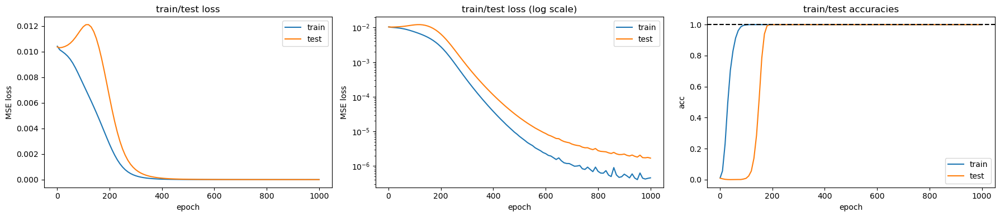

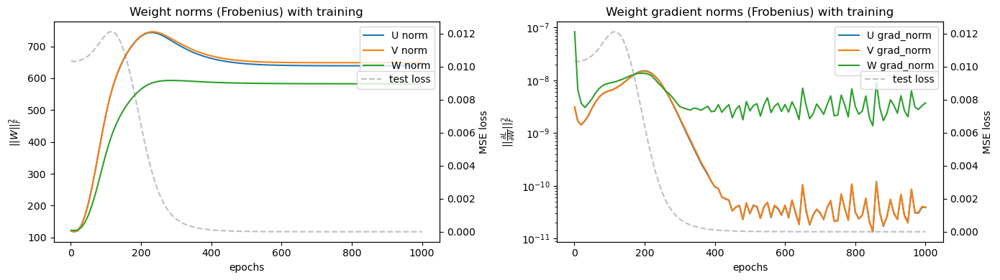

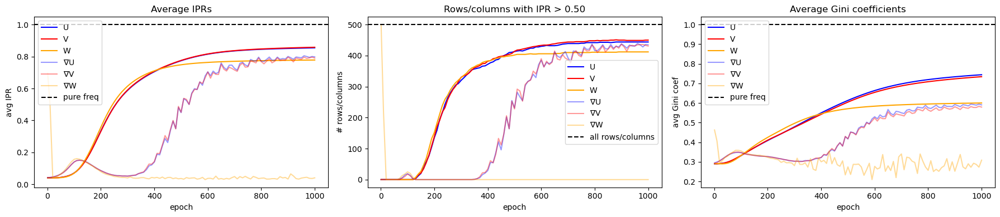

In [119]:
#@title Plot stuff

if_savefig = False

####################### Losses and Accuracies #######################
plt.figure(figsize=(18,4))

plt.subplot(1,3,1)
plt.title('train/test loss')
plt.xlabel('epoch')
plt.ylabel('MSE loss')
plt.plot(data_epochs, train_losses, label='train')
plt.plot(data_epochs, test_losses, label='test')
plt.legend()

plt.subplot(1,3,2)
plt.title('train/test loss (log scale)')
plt.xlabel('epoch')
plt.ylabel('MSE loss')
plt.plot(data_epochs, train_losses, label='train')
plt.plot(data_epochs, test_losses, label='test')
plt.yscale('log')
plt.legend()

plt.subplot(1,3,3)
plt.title('train/test accuracies')
plt.xlabel('epoch')
plt.ylabel('acc')
plt.plot(data_epochs, train_accs, label='train')
plt.plot(data_epochs, test_accs, label='test')
plt.axhline(y=1.0, color='black', linestyle='dashed')
plt.legend()

plt.tight_layout()
if if_savefig:
    plt.savefig('./losses_accs.pdf', dpi=300, format='pdf')


###################### Weight Norms and Gradient Norms #######################
if if_weight_norms and if_grad_norms:
    plt.figure(figsize=(14,4))
    num = 2
elif if_weight_norms or if_grad_norms:
    plt.figure(figsize=(7,4))
    num = 1

if if_weight_norms:

    ax1 = plt.subplot(1,num,1)
    ax1.set_title('Weight norms (Frobenius) with training')
    ax1.set_xlabel('epochs')
    ax1.set_ylabel('$||W||^2_F$')
    ax1.plot(data_epochs, weight_norms['U'], label='U norm')
    ax1.plot(data_epochs, weight_norms['V'], label='V norm')
    ax1.plot(data_epochs, weight_norms['W'], label='W norm')
    ax1.legend(bbox_to_anchor=(1,1), loc='upper right')

    ax2 = ax1.twinx()
    ax2.set_ylabel('MSE loss')
    ax2.plot(data_epochs, test_losses, color='grey', alpha=0.5, linestyle='dashed', label='test loss')
    ax2.legend(bbox_to_anchor=(1,0.8), loc='upper right')

if if_grad_norms:

    ax1 = plt.subplot(1,num,num)
    ax1.set_title('Weight gradient norms (Frobenius) with training')
    ax1.set_xlabel('epochs')
    ax1.set_ylabel('$||\\frac{\\partial L}{\\partial W}||^2_F$')
    ax1.plot(data_epochs, grad_norms['U'], label='U grad_norm')
    ax1.plot(data_epochs, grad_norms['V'], label='V grad_norm')
    ax1.plot(data_epochs, grad_norms['W'], label='W grad_norm')

    ax1.set_yscale('log')
    ax1.legend(bbox_to_anchor=(1,1), loc='upper right')

    ax2 = ax1.twinx()
    ax2.set_ylabel('MSE loss')
    ax2.plot(data_epochs, test_losses, color='grey', alpha=0.5, linestyle='dashed', label='test loss')
    ax2.legend(bbox_to_anchor=(1,0.8), loc='upper right')

plt.tight_layout()
if if_savefig:
    plt.savefig('norms.pdf', dpi=300, format='pdf')


########### IPRs and Gini coefficients ###########
if if_iprs:
    plt.figure(figsize=(18,4))

    plt.subplot(1,3,1)
    # plt.ylim(0, 0.5)
    plt.title('Average IPRs')
    plt.xlabel('epoch')
    plt.ylabel('avg IPR')
    plt.plot(data_epochs, iprs['U'].mean(axis=1), color='blue', label='U')
    plt.plot(data_epochs, iprs['V'].mean(axis=1), color='red', label='V')
    plt.plot(data_epochs, iprs['W'].mean(axis=1), color='orange', label='W')
    plt.plot(data_epochs, iprs['U_grad'].mean(axis=1), alpha=0.4, color='blue', label='$\\nabla$U')
    plt.plot(data_epochs, iprs['V_grad'].mean(axis=1), alpha=0.4, color='red', label='$\\nabla$V')
    plt.plot(data_epochs, iprs['W_grad'].mean(axis=1), alpha=0.4, color='orange', label='$\\nabla$W')
    plt.axhline(y=1.0, color='black', linestyle='dashed', label='pure freq')
    plt.legend()

    plt.subplot(1,3,2)
    plt.title('Rows/columns with IPR > {:.2f}'.format(chi_ipr))
    plt.xlabel('epoch')
    plt.ylabel('# rows/columns')
    plt.plot(data_epochs, counts['U'], color='blue', label='U')
    plt.plot(data_epochs, counts['V'], color='red', label='V')
    plt.plot(data_epochs, counts['W'], color='orange', label='W')
    plt.plot(data_epochs, counts['U_grad'], alpha=0.4, color='blue', label='$\\nabla$U')
    plt.plot(data_epochs, counts['V_grad'], alpha=0.4, color='red', label='$\\nabla$V')
    plt.plot(data_epochs, counts['W_grad'], alpha=0.4, color='orange', label='$\\nabla$W')
    plt.axhline(y=N, color='black', linestyle='dashed', label='all rows/columns')
    plt.legend()

    plt.subplot(1,3,3)
    plt.title('Average Gini coefficients')
    plt.xlabel('epoch')
    plt.ylabel('avg Gini coef')
    plt.plot(data_epochs, gini_coefs['U'].mean(axis=1), color='blue', label='U')
    plt.plot(data_epochs, gini_coefs['V'].mean(axis=1), color='red', label='V')
    plt.plot(data_epochs, gini_coefs['W'].mean(axis=1), color='orange', label='W')
    plt.plot(data_epochs, gini_coefs['U_grad'].mean(axis=1), alpha=0.4, color='blue', label='$\\nabla$U')
    plt.plot(data_epochs, gini_coefs['V_grad'].mean(axis=1), alpha=0.4, color='red', label='$\\nabla$V')
    plt.plot(data_epochs, gini_coefs['W_grad'].mean(axis=1), alpha=0.4, color='orange', label='$\\nabla$W')
    plt.axhline(y=1.0, color='black', linestyle='dashed', label='pure freq')
    plt.legend()

    plt.tight_layout()
    if if_savefig:
        plt.savefig(f'./grokking_analytical(UV)_iprs_gd_frac=0dot5_lr={lr}_wd={wd}.pdf', dpi=300, format='pdf')


plt.show()

# Compare inputs with targets

In [120]:
## 2d inputs and targets

H1s = h1s_ordered.reshape((data_epochs.shape[0], p, p, -1))
H2s = h2s_ordered.reshape((data_epochs.shape[0], p, p, -1))
print(H1s.shape, H2s.shape)

targets_2d = np.zeros((p,p))
outputs_2d = np.zeros((p,p))
for i in range(total_size):
    targets_2d[i//p,i%p] = Y_og[i]
    outputs_2d[i//p,i%p] = outputs_ordered[i].real.argmax()
print(targets_2d.shape, outputs_2d.shape)

(101, 97, 97, 500) (101, 97, 97, 97)
(97, 97) (97, 97)


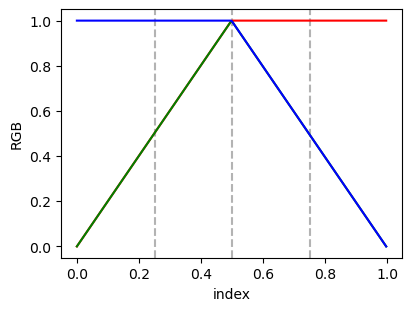

In [121]:
## Costum colorbar

cdict = {'red':   [[0.0,  0.0, 0.0],
                   [1/2, 1.0, 1.0],
                   [1.0, 1.0, 1.0]],
         'green': [[0.0,  0.0, 0.0],
                   [1/2, 1.0, 1.0],
                   [1.0, 0.0, 0.0]],
         'blue':  [[0.0,  1.0, 1.0],
                   [1/2, 1.0, 1.0],
                   [1.0,  0.0, 0.0]]}
plot_linearmap(cdict)

my_cmap = LinearSegmentedColormap('testCmap', segmentdata=cdict, N=256)

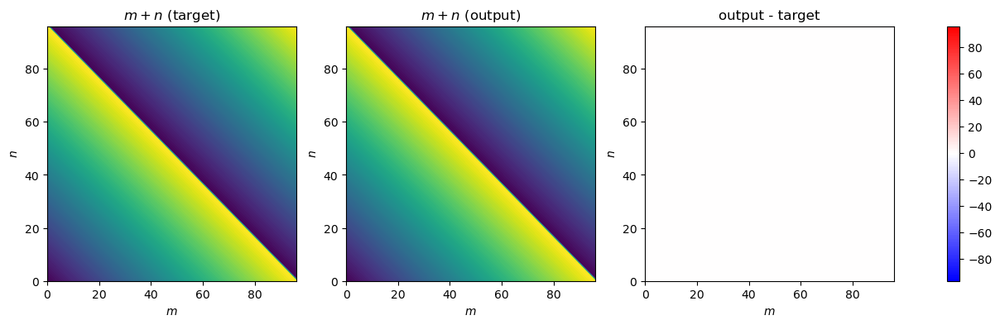

In [122]:
## Compare outputs with targets

fig, (ax1,ax2,ax3) = plt.subplots(1, 3, figsize=(16.5,4))

ax1.set_title('$m + n$ (target)')
ax1.set_xlabel('$m$')
ax1.set_ylabel('$n$')
cs_target = ax1.contourf(np.arange(p), np.arange(p), targets_2d, levels=np.arange(p))

ax2.set_title('$m + n$ (output)')
ax2.set_xlabel('$m$')
ax2.set_ylabel('$n$')
cs_output = ax2.contourf(np.arange(p), np.arange(p), outputs_2d, levels=np.arange(p))

ax3.set_title('output - target')
ax3.set_xlabel('$m$')
ax3.set_ylabel('$n$')
cs_diff = plt.contourf(np.arange(p), np.arange(p), outputs_2d-targets_2d, levels=np.arange(-p, p), cmap=my_cmap)

plt.colorbar(cs_diff, ax=[ax1,ax2,ax3])

plt.show()

# Fourier plots

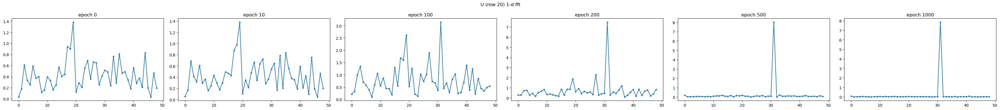

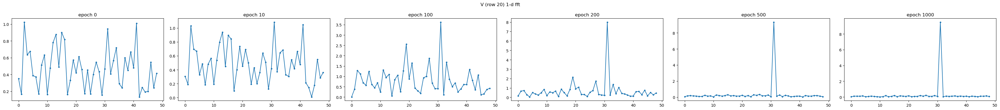

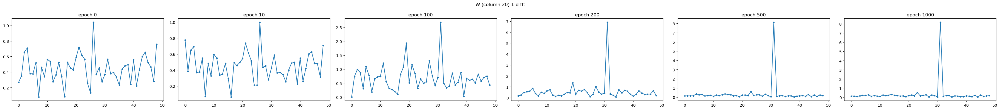

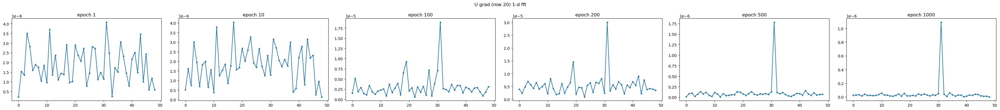

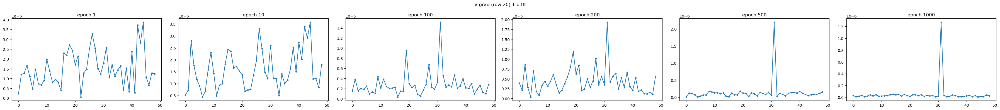

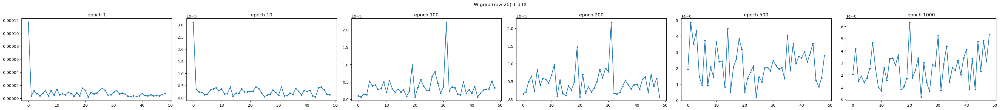

In [123]:
## Plot Fourier transform (amplitudes) of rows/columns of weights & gradients (one row of figures each)

epoch_list = [10,100,200,500,1000]

epoch_id_list = []
ind = 0
for e in epoch_list:
    if e==1:
        epoch_id_list.append(0)
        ind = 1
        continue
    if e%data_every != 0:
        raise Exception("Pick the epoch_list more carefully!")
    epoch_id_list.append( int(e//data_every) - ind )

k = 20      ## row/column index of the weight matrices
# line_k = k

if_savefig = False

if if_weights:
    ###### U ######
    plt.figure(figsize=(36,4))
    plt.suptitle(f'U (row {k}) 1-d fft')

    plt.subplot(1,6,1)
    # plt.ylim(-0.2,10.0)
    plt.title('epoch 0')
    plt.plot(np.abs(np.fft.rfft(weight_init['U'][k])), '.-')
    # line(line_k, p)

    for i in range(len(epoch_id_list)):
        plt.subplot(1,6,i+2)
        # plt.ylim(-0.2,10.0)
        plt.title(f'epoch {epoch_list[i]}')
        plt.plot(np.abs(np.fft.rfft(weights['U'][epoch_id_list[i],k])), '.-')
        # line(line_k, p)

    plt.tight_layout()
    if if_savefig:
        plt.savefig(f'./fft_U.pdf', dpi=300, format='pdf')
    ############

    ###### V ######
    plt.figure(figsize=(36,4))
    plt.suptitle(f'V (row {k}) 1-d fft')

    plt.subplot(1,6,1)
    plt.title('epoch 0')
    plt.plot(np.abs(np.fft.rfft(weight_init['V'][k])), '.-')
    # line(line_k, p)

    for i in range(len(epoch_id_list)):
        plt.subplot(1,6,i+2)
        plt.title(f'epoch {epoch_list[i]}')
        plt.plot(np.abs(np.fft.rfft(weights['V'][epoch_id_list[i],k])), '.-')
        # line(line_k, p)

    plt.tight_layout()
    if if_savefig:
        plt.savefig(f'./fft_V.pdf', dpi=300, format='pdf')
    ############

    ###### W ######
    plt.figure(figsize=(36,4))
    plt.suptitle(f'W (column {k}) 1-d fft')

    plt.subplot(1,6,1)
    plt.title('epoch 0')
    plt.plot(np.abs(np.fft.rfft(weight_init['W'][:,k])), '.-')
    # line(line_k, p)

    for i in range(len(epoch_id_list)):
        plt.subplot(1,6,i+2)
        plt.title(f'epoch {epoch_list[i]}')
        plt.plot(np.abs(np.fft.rfft(weights['W'][epoch_id_list[i],:,k])), '.-')
        # line(line_k, p)

    plt.tight_layout()
    if if_savefig:
        plt.savefig(f'./fft_W.pdf', dpi=300, format='pdf')
    ############

if if_grads:
    ###### U grad ######
    plt.figure(figsize=(36,4))
    plt.suptitle(f'U grad (row {k}) 1-d fft')

    plt.subplot(1,6,1)
    plt.title('epoch 1')
    plt.plot(np.abs(np.fft.rfft(grads['U'][0,k])), '.-')
    # line(line_k, p)

    for i in range(len(epoch_id_list)):
        plt.subplot(1,6,i+2)
        plt.title(f'epoch {epoch_list[i]}')
        plt.plot(np.abs(np.fft.rfft(grads['U'][epoch_id_list[i],k])), '.-')
        # line(line_k, p)

    plt.tight_layout()
    if if_savefig:
        plt.savefig(f'./fft_U_grad.pdf', dpi=300, format='pdf')
    ############

    ###### V grad ######
    plt.figure(figsize=(36,4))
    plt.suptitle(f'V grad (row {k}) 1-d fft')

    plt.subplot(1,6,1)
    plt.title('epoch 1')
    plt.plot(np.abs(np.fft.rfft(grads['V'][0,k])), '.-')
    # line(line_k, p)

    for i in range(len(epoch_id_list)):
        plt.subplot(1,6,i+2)
        plt.title(f'epoch {epoch_list[i]}')
        plt.plot(np.abs(np.fft.rfft(grads['V'][epoch_id_list[i],k])), '.-')
        # line(line_k, p)

    plt.tight_layout()
    if if_savefig:
        plt.savefig(f'./fft_V_grad.pdf', dpi=300, format='pdf')
    ############

    ###### W grad ######
    plt.figure(figsize=(36,4))
    plt.suptitle(f'W grad (row {k}) 1-d fft')

    plt.subplot(1,6,1)
    plt.title('epoch 1')
    plt.plot(np.abs(np.fft.rfft(grads['W'][0,:,k])), '.-')
    # line(line_k, p)

    for i in range(len(epoch_id_list)):
        plt.subplot(1,6,i+2)
        plt.title(f'epoch {epoch_list[i]}')
        plt.plot(np.abs(np.fft.rfft(grads['W'][epoch_id_list[i],:,k])), '.-')
        # line(line_k, p)

    plt.tight_layout()
    if if_savefig:
        plt.savefig(f'./fft_W_grad={wd}.pdf', dpi=300, format='pdf')
    ############

plt.show()

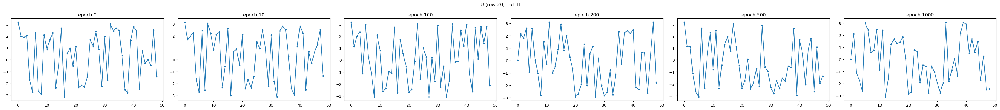

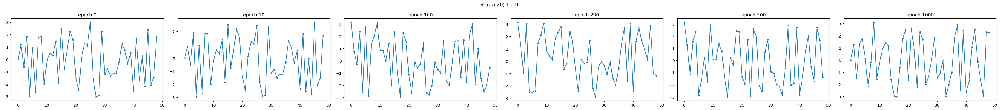

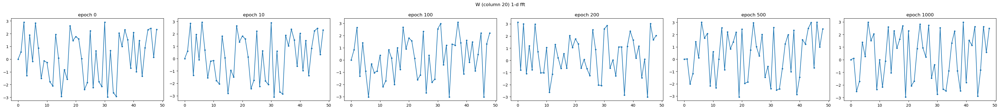

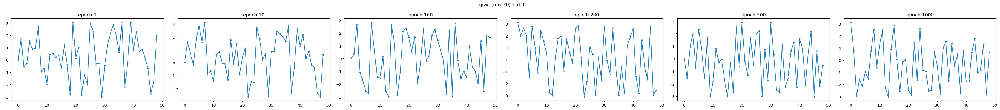

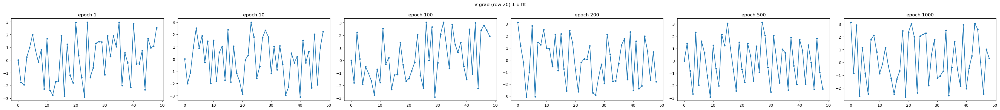

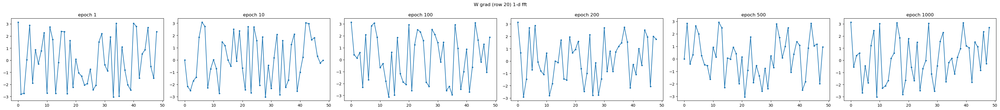

In [124]:
#@title Plot PHSAES from Fourier transform of rows/columns of weights & gradients

epoch_list = [10, 100, 200, 500, 1000]

epoch_id_list = []
ind = 0
for e in epoch_list:
    if e==1:
        epoch_id_list.append(0)
        ind = 1
        continue
    if e%data_every != 0:
        raise Exception("Pick the epoch_list more carefully!")
    epoch_id_list.append( int(e//data_every) - ind )

k=20        ## row/column index of the weight matrices
# line_k = k

if_savefig = False

if if_weights:
    ###### U ######
    plt.figure(figsize=(36,4))
    plt.suptitle(f'U (row {k}) 1-d fft')

    plt.subplot(1,6,1)
    plt.title('epoch 0')
    plt.plot(np.angle(np.fft.rfft(weight_init['U'][k])), '.-')
    # line(line_k, p)

    for i in range(len(epoch_id_list)):
        plt.subplot(1,6,i+2)
        plt.title(f'epoch {epoch_list[i]}')
        plt.plot(np.angle(np.fft.rfft(weights['U'][epoch_id_list[i],k])), '.-')
        # line(line_k, p)

    plt.tight_layout()
    if if_savefig:
        plt.savefig(f'./fft_phases_U.pdf', dpi=300, format='pdf')
    ############

    ###### V ######
    plt.figure(figsize=(36,4))
    plt.suptitle(f'V (row {k}) 1-d fft')

    plt.subplot(1,6,1)
    plt.title('epoch 0')
    plt.plot(np.angle(np.fft.rfft(weight_init['V'][k])), '.-')
    # line(line_k, p)

    for i in range(len(epoch_id_list)):
        plt.subplot(1,6,i+2)
        plt.title(f'epoch {epoch_list[i]}')
        plt.plot(np.angle(np.fft.rfft(weights['V'][epoch_id_list[i],k])), '.-')
        # line(line_k, p)

    plt.tight_layout()
    if if_savefig:
        plt.savefig(f'./fft_phases_V.pdf', dpi=300, format='pdf')
    ############

    ###### W ######
    plt.figure(figsize=(36,4))
    plt.suptitle(f'W (column {k}) 1-d fft')

    plt.subplot(1,6,1)
    plt.title('epoch 0')
    plt.plot(np.angle(np.fft.rfft(weight_init['W'][:,k])), '.-')
    # line(line_k, p)

    for i in range(len(epoch_id_list)):
        plt.subplot(1,6,i+2)
        plt.title(f'epoch {epoch_list[i]}')
        plt.plot(np.angle(np.fft.rfft(weights['W'][epoch_id_list[i],:,k])), '.-')
        # line(line_k, p)

    plt.tight_layout()
    if if_savefig:
        plt.savefig(f'./fft_phases_W.pdf', dpi=300, format='pdf')
    ############

if if_grads:
    ###### U grad ######
    plt.figure(figsize=(36,4))
    plt.suptitle(f'U grad (row {k}) 1-d fft')

    plt.subplot(1,6,1)
    plt.title('epoch 1')
    plt.plot(np.angle(np.fft.rfft(grads['U'][0,k])), '.-')
    # line(line_k, p)

    for i in range(len(epoch_id_list)):
        plt.subplot(1,6,i+2)
        plt.title(f'epoch {epoch_list[i]}')
        plt.plot(np.angle(np.fft.rfft(grads['U'][epoch_id_list[i],k])), '.-')
        # line(line_k, p)

    plt.tight_layout()
    if if_savefig:
        plt.savefig(f'./fft_phases_U_grad.pdf', dpi=300, format='pdf')
    ############

    ###### V grad ######
    plt.figure(figsize=(36,4))
    plt.suptitle(f'V grad (row {k}) 1-d fft')

    plt.subplot(1,6,1)
    plt.title('epoch 1')
    plt.plot(np.angle(np.fft.rfft(grads['V'][0,k])), '.-')
    # line(line_k, p)

    for i in range(len(epoch_id_list)):
        plt.subplot(1,6,i+2)
        plt.title(f'epoch {epoch_list[i]}')
        plt.plot(np.angle(np.fft.rfft(grads['V'][epoch_id_list[i],k])), '.-')
        # line(line_k, p)

    plt.tight_layout()
    if if_savefig:
        plt.savefig(f'./fft_phases_V_grad.pdf', dpi=300, format='pdf')
    ############

    ###### W grad ######
    plt.figure(figsize=(36,4))
    plt.suptitle(f'W grad (row {k}) 1-d fft')

    plt.subplot(1,6,1)
    plt.title('epoch 1')
    plt.plot(np.angle(np.fft.rfft(grads['W'][0,:,k])), '.-')
    # line(line_k, p)

    for i in range(len(epoch_id_list)):
        plt.subplot(1,6,i+2)
        plt.title(f'epoch {epoch_list[i]}')
        plt.plot(np.angle(np.fft.rfft(grads['W'][epoch_id_list[i],:,k])), '.-')
        # line(line_k, p)

    plt.tight_layout()
    if if_savefig:
        plt.savefig(f'./fft_phases_W_grad.pdf', dpi=300, format='pdf')
    ############

plt.show()

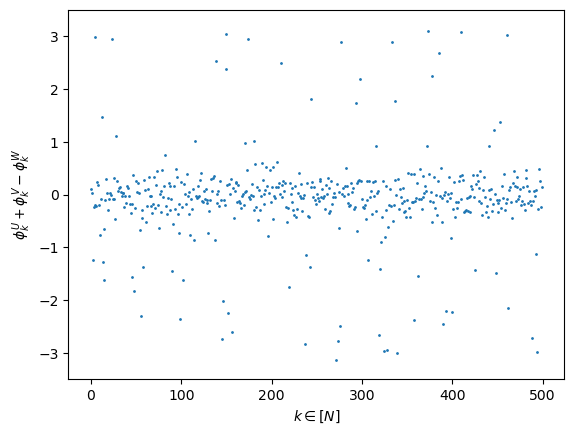

In [125]:
## Phase constraint

peak1U = np.empty(N, int); peak1V = np.empty(N, int); peak1W = np.empty(N, int)
phase1U = np.zeros(N); phase1V = np.zeros(N); phase1W = np.zeros(N)
add1 = np.zeros(N); add2 = np.zeros(N); add3 = np.zeros(N)
for k in range(N):
    ## U ##
    fftU = np.fft.rfft(weights['U'][-1,k])
    peaksU = np.argpartition(np.abs(fftU), -1)[-1:]
    peak1U[k] = peaksU[0]
    phase1U = np.angle(fftU)[peak1U[k]]
    
    ## V ##
    fftV = np.fft.rfft(weights['V'][-1,k])
    peaksV = np.argpartition(np.abs(fftV), -1)[-1:]
    peak1V[k] = peaksV[0]
    phase1V = np.angle(fftV)[peak1V[k]]
    
    ## W ##
    fftW = np.fft.rfft(weights['W'][-1,:,k])
    peaksW = np.argpartition(np.abs(fftW), -1)[-1:]
    peak1W[k] = peaksW[0]
    phase1W = np.angle(fftW)[peak1W[k]]
       
    add1[k] = phase1U + phase1V - phase1W
for j in range(2):
    add1 = np.where(add1 > -np.pi, add1, add1 + 2*np.pi)
    add1 = np.where(add1 < np.pi, add1, add1 - 2*np.pi)


plt.scatter(range(N), add1, s=1.)
plt.xlabel('$k \\in [N]$')
plt.ylabel('$\\phi^U_k + \\phi^V_k - \\phi^W_k$')
plt.ylim(-3.5, 3.5)
plt.show()

# Visulize Features

In [133]:
## create 2d arrays of inputs and targets

H1s = h1s_ordered.reshape((data_epochs.shape[0], p, p, -1))
H2s = h2s_ordered.reshape((data_epochs.shape[0], p, p, -1))
print(H1s.shape, H2s.shape)

targets_2d = np.zeros((p,p))
outputs_2d = np.zeros((p,p))
for i in range(total_size):
    targets_2d[i//p,i%p] = Y_og[i]
    outputs_2d[i//p,i%p] = outputs_ordered[i].real.argmax()
print(targets_2d.shape, outputs_2d.shape)

(101, 97, 97, 500) (101, 97, 97, 97)
(97, 97) (97, 97)


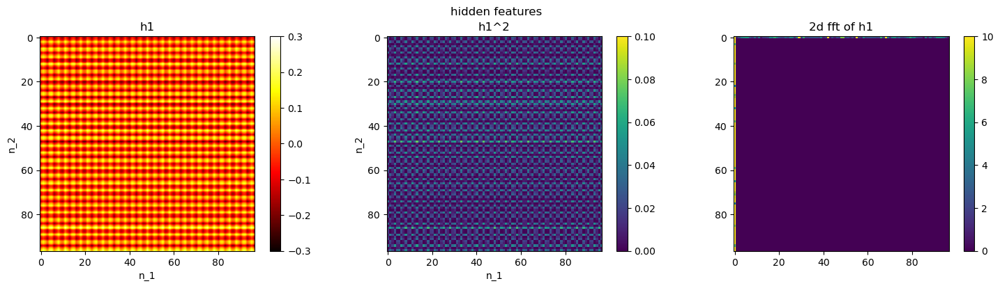

In [130]:
## hidden features (h1s)

k = 45       ## hidden index

plt.figure(figsize = (15,4))
plt.suptitle('hidden features')

plt.subplot(1,3,1)
plt.title('h1')
plt.xlabel('n_1')
plt.ylabel('n_2')
plt.imshow(H1s.real[-1,:,:,k], vmin=-0.3, vmax=0.3, cmap='hot', interpolation='bilinear')
plt.colorbar()

plt.subplot(1,3,2)
plt.title('h1^2')
plt.xlabel('n_1')
plt.ylabel('n_2')
plt.imshow(H1s.real[-1,:,:,k]**2, vmin=0.0, vmax=0.1)
plt.colorbar()

plt.subplot(1,3,3)
plt.title('2d fft of h1')
plt.imshow(np.absolute(np.fft.fft2(H1s[-1,:,:,k])), vmin=0, vmax=10)
plt.colorbar()

plt.tight_layout()

plt.show()

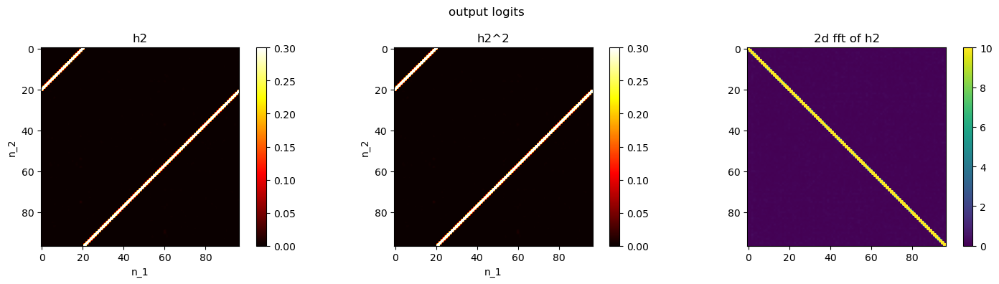

In [131]:
## output logits (h2s)

q = 20       ## output index

plt.figure(figsize = (15,4))
plt.suptitle('output logits')

plt.subplot(1,3,1)
plt.title('h2')
plt.xlabel('n_1')
plt.ylabel('n_2')
plt.imshow(H2s.real[-1,:,:,q], vmin=0.0, vmax=0.3,  cmap='hot', interpolation='bilinear')
plt.colorbar()

plt.subplot(1,3,2)
plt.title('h2^2')
plt.xlabel('n_1')
plt.ylabel('n_2')
# plt.imshow(H2s[:,:,q]**2, vmin=0.0, vmax=0.1)
plt.imshow(H2s.real[-1,:,:,q], vmin=0.0, vmax=0.3,  cmap='hot', interpolation='bilinear')
plt.colorbar()

plt.tight_layout()

plt.subplot(1,3,3)
plt.title('2d fft of h2')
plt.imshow(np.absolute(np.fft.fft2(H2s[-1,:,:,q])), vmin=0, vmax=10)
plt.colorbar()

plt.tight_layout()

plt.show()

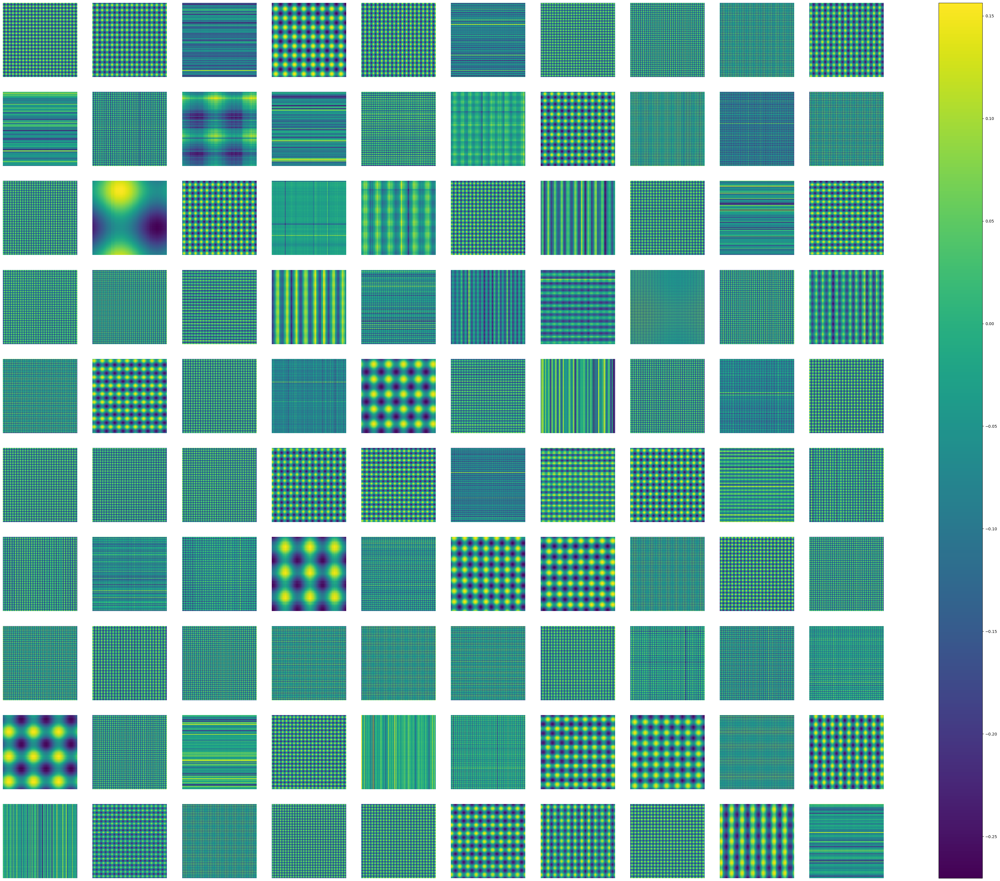

In [132]:
##  hidden features (10x10 grid)

fig, axs = plt.subplots(10, 10, figsize=(50,40))
# plt.suptitle('hidden features (h1s)')

for i in range(10):
    for j in range(10):
        cf = axs[i,j].imshow(H1s[-1,:,:,10*i+j].real)
        axs[i,j].axis('off')

fig.colorbar(cf, ax=axs)
# plt.tight_layout()
plt.show()